Scatter({
    'hoverinfo': 'text',
    'marker': {'color': [15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15,
                         15, 15],
               'colorbar': {'thickness': 15, 'title': {'side': 'right', 'text': 'Node Connections'}, 'xanchor': 'left'},
               'colorscale': 'YlGnBu',
               'line': {'width': 2},
               'reversescale': True,
               'showscale': True,
               'size': 10},
    'mode': 'markers',
    'text': [# of connections: 15, # of connections: 15, # of connections: 15, #
             of connections: 15, # of connections: 15, # of connections: 15, # of
             connections: 15, # of connections: 15, # of connections: 15, # of
             connections: 15, # of connections: 15, # of connections: 15, # of
             connections: 15, # of connections: 15, # of connections: 15, # of
             connections: 15],
    'x': [-0.13405205631239073, -0.9422575731896993, -0.8643618366953069,
          -0.3145288153605

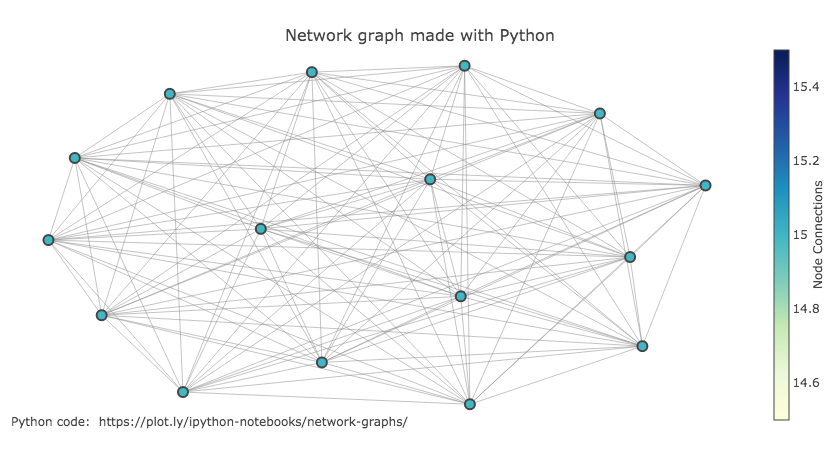

In [2]:
import pandas as pd
import numpy as np
from scipy.spatial import distance
import networkx as nx
import string
from plotly.graph_objs import *
import plotly
import plotly.plotly as py
import plotly.graph_objs as go
# these two lines allow your code to show up in a notebook
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode()

# plotly.tools.set_credentials_file(username='slt666666', api_key='KEROY4DT9JraomPybSjQ')

# # extract only "gene" list from gff
# gff_tomato = pd.read_table("original_data/ITAG3.2_gene_models.gff", header=None, skiprows=14)
# gff_tomato = gff_tomato[gff_tomato.iloc[:, 2] == "gene"]
# # print(gff_tomato.head())
#
# # extract NLR gene_ids from data_AKI
# NLR_list = pd.read_csv("original_data/tomato_NLRs_from_AKI.csv")
# NLR_list = np.sort(NLR_list.gene_short_na)
# # print(NLR_list[0:10])
#
# # extract gene info
# NLR_gene_info = pd.DataFrame()
# for gene_id in NLR_list:
#     each_gene_info = gff_tomato[gff_tomato.iloc[:,8].str.contains(gene_id)]
#     each_gene_info["gene_id"] = gene_id
#     NLR_gene_info = pd.concat([NLR_gene_info, each_gene_info])
#
# NLR_gene_info = pd.DataFrame(NLR_gene_info)
# NLR_gene_info.to_csv("NLR_gene_info.csv")
# # print(NLR_gene_info.head())
# # print(NLR_gene_info.iloc[0,:])

# extract gene_distance info
NLR_gene_info = pd.read_csv("original_data/NLR_gene_info.csv", index_col=0)
position_data = NLR_gene_info.iloc[:, [0,3,4,9]]
position_data.columns = ["chr", "start", "end", "id"]

# tmp_position_data = position_data.iloc[0:3, 1]
# tmp_position_data = np.stack([np.array(tmp_position_data), np.zeros(tmp_position_data.shape[0])], 1)

# dist = distance.cdist(tmp_position_data, tmp_position_data, metric='euclidean')
# print(dist)

def calc_distance(data_from_chr):
    tmp_position_data = data_from_chr.iloc[:, 1]
    tmp_position_data = np.stack([np.array(tmp_position_data), np.zeros(tmp_position_data.shape[0])], 1)

    dist = distance.cdist(tmp_position_data, tmp_position_data, metric='euclidean')
#     print(dist)
    return dist

# position_data.groupby(["chr"]).apply(calc_distance)

def draw_graph(dist):

    dt = [('len', float)]
    A = dist
    A = A.view(dt)

    G = nx.from_numpy_matrix(A)
    pos = nx.spring_layout(G)
    pos = nx.fruchterman_reingold_layout(G)

    edge_trace = Scatter(
        x=[],
        y=[],
        line=dict(width=0.5,color='#888'),
        hoverinfo='none',
        mode='lines')

    for edge in G.edges():
        x0, y0 = pos[edge[0]][0], pos[edge[0]][1]
        x1, y1 = pos[edge[1]][0], pos[edge[1]][1]
        edge_trace['x'] += tuple([x0, x1, None])
        edge_trace['y'] += tuple([y0, y1, None])


    node_trace = Scatter(
        x=[],
        y=[],
        text=[],
        mode='markers',
        hoverinfo='text',
        marker=dict(
            showscale=True,
            # colorscale options
            #'Greys' | 'YlGnBu' | 'Greens' | 'YlOrRd' | 'Bluered' | 'RdBu' |
            #'Reds' | 'Blues' | 'Picnic' | 'Rainbow' | 'Portland' | 'Jet' |
            #'Hot' | 'Blackbody' | 'Earth' | 'Electric' | 'Viridis' |
            colorscale='YlGnBu',
            reversescale=True,
            color=[],
            size=10,
            colorbar=dict(
                thickness=15,
                title='Node Connections',
                xanchor='left',
                titleside='right'
            ),
            line=dict(width=2)))

    for node in G.nodes():
        x, y = pos[node][0], pos[node][1]
        node_trace['x'] += tuple([x])
        node_trace['y'] += tuple([y])

    for node, adjacencies in enumerate(G.adjacency()):
        node_trace['marker']['color']+=tuple([len(adjacencies[1])])
        node_info = '# of connections: '+str(len(adjacencies[1]))
        node_trace['text']+=tuple([node_info])
    print(node_trace)
    fig = Figure(data=[edge_trace, node_trace],
                 layout=Layout(
                    title='<br>Network graph made with Python',
                    titlefont=dict(size=16),
                    showlegend=False,
                    hovermode='closest',
                    margin=dict(b=20,l=5,r=5,t=40),
                    annotations=[ dict(
                        text="Python code: <a href='https://plot.ly/ipython-notebooks/network-graphs/'> https://plot.ly/ipython-notebooks/network-graphs/</a>",
                        showarrow=False,
                        xref="paper", yref="paper",
                        x=0.005, y=-0.002 ) ],
                    xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                    yaxis=dict(showgrid=False, zeroline=False, showticklabels=False)))

    return fig
    
position_data = position_data[position_data["chr"] == "SL3.0ch01"]
dist = calc_distance(position_data)
fig = draw_graph(dist)
plotly.offline.iplot(fig, filename='networkx')

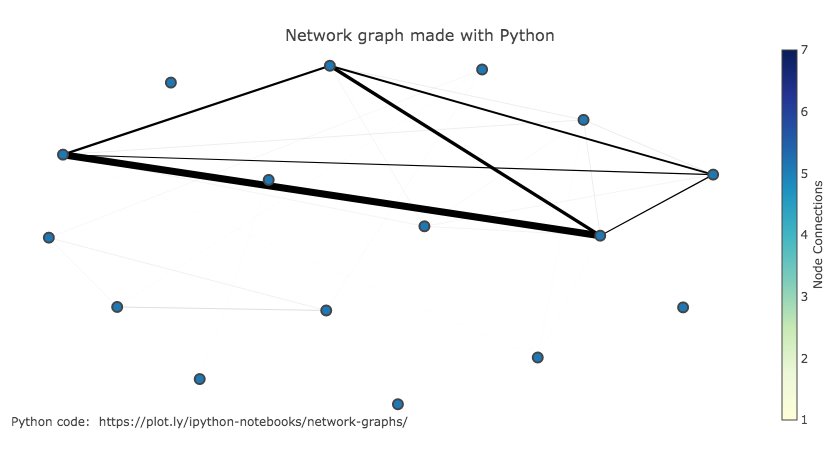

In [3]:
# extract gene_distance info
NLR_gene_info = pd.read_csv("original_data/NLR_gene_info.csv", index_col=0)
position_data = NLR_gene_info.iloc[:, [0,3,4,9]]
position_data.columns = ["chr", "start", "end", "id"]

#tmp
position_data = position_data[position_data["chr"] == "SL3.0ch01"]
position_data = position_data.sort_values(["start"])

def calc_distance(data_from_chr):
    tmp_position_data = data_from_chr.iloc[:, 1]
    tmp_position_data = np.stack([np.array(tmp_position_data), np.zeros(tmp_position_data.shape[0])], 1)

    dist = distance.cdist(tmp_position_data, tmp_position_data, metric='euclidean')
    return dist

def draw_graph(dist):

    dt = [('len', float)]
    A = dist
    A = A.view(dt)

    G = nx.from_numpy_matrix(A)
    pos = nx.spring_layout(G)
    pos = nx.fruchterman_reingold_layout(G)
        
    edge_trace = Scatter(
        x=[],
        y=[],
        line=dict(width=0.5,color='#888'),
        hoverinfo='none',
        mode='lines')

    for edge in G.edges():
        x0, y0 = pos[edge[0]][0], pos[edge[0]][1]
        x1, y1 = pos[edge[1]][0], pos[edge[1]][1]
        edge_trace['x'] += tuple([x0, x1, None])
        edge_trace['y'] += tuple([y0, y1, None])


    node_trace = Scatter(
        x=[],
        y=[],
        text=[],
        mode='markers',
        hoverinfo='text',
        marker=dict(
            showscale=True,
            # colorscale options
            #'Greys' | 'YlGnBu' | 'Greens' | 'YlOrRd' | 'Bluered' | 'RdBu' |
            #'Reds' | 'Blues' | 'Picnic' | 'Rainbow' | 'Portland' | 'Jet' |
            #'Hot' | 'Blackbody' | 'Earth' | 'Electric' | 'Viridis' |
            colorscale='YlGnBu',
            reversescale=True,
            color=[],
            size=10,
            colorbar=dict(
                thickness=15,
                title='Node Connections',
                xanchor='left',
                titleside='right'
            ),
            line=dict(width=2)))
    
    node_pos = pd.DataFrame(pos)
    
    nodes=dict(type='scatter',
           x=node_pos.iloc[0,:],
           y=node_pos.iloc[1,:],
           mode='markers',
           marker=dict(size=10, colorscale='YlGnBu', showscale=True, reversescale=True, line={'width': 2},
            colorbar=dict(
                thickness=15,
                title='Node Connections',
                xanchor='left',
                titleside='right'
            )))
        
    edges_list=[ dict(type='scatter',
             x=[pos[i[0]][0], pos[i[1]][0]],
             y=[pos[i[0]][1], pos[i[1]][1]],
              mode='lines',
              line=dict(width=50000/i[2]["len"], color="black"))  for i in G.edges(data=True)]

    fig = Figure(data=edges_list+[nodes],
                 layout=Layout(
                    title='<br>Network graph made with Python',
                    titlefont=dict(size=16),
                    showlegend=False,
                    hovermode='closest',
                    margin=dict(b=20,l=5,r=5,t=40),
                    annotations=[ dict(
                        text="Python code: <a href='https://plot.ly/ipython-notebooks/network-graphs/'> https://plot.ly/ipython-notebooks/network-graphs/</a>",
                        showarrow=False,
                        xref="paper", yref="paper",
                        x=0.005, y=-0.002 ) ],
                    xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                    yaxis=dict(showgrid=False, zeroline=False, showticklabels=False)))

    return fig

dist = calc_distance(position_data)
fig = draw_graph(dist)
plotly.offline.iplot(fig, filename='networkx')

          chr     start       end              id        clade  color
46  SL3.0ch04    355238    361526  Solyc04g005540      No_info  black
47  SL3.0ch04    362242    367146  Solyc04g005550      No_info  black
48  SL3.0ch04    742397    747898  Solyc04g007030        NRC4c    red
49  SL3.0ch04    763876    769023  Solyc04g007050         NRC5    red
50  SL3.0ch04    773637    778420  Solyc04g007060        NRC4b    red
51  SL3.0ch04    790864    796155  Solyc04g007070        NRC4a    red
52  SL3.0ch04    801135    804562  Solyc04g007090      No_info  black
53  SL3.0ch04   1035127   1040604  Solyc04g007320      No_info  black
54  SL3.0ch04   1160127   1166547  Solyc04g007490       CNL-11   blue
55  SL3.0ch04   1795220   1800554  Solyc04g008120      No_info  black
57  SL3.0ch04   1811258   1827806  Solyc04g008140      No_info  black
56  SL3.0ch04   1811261   1814513  Solyc04g008130         CNL9   blue
58  SL3.0ch04   1829341   1834179  Solyc04g008150         NRC6    red
59  SL3.0ch04   1839

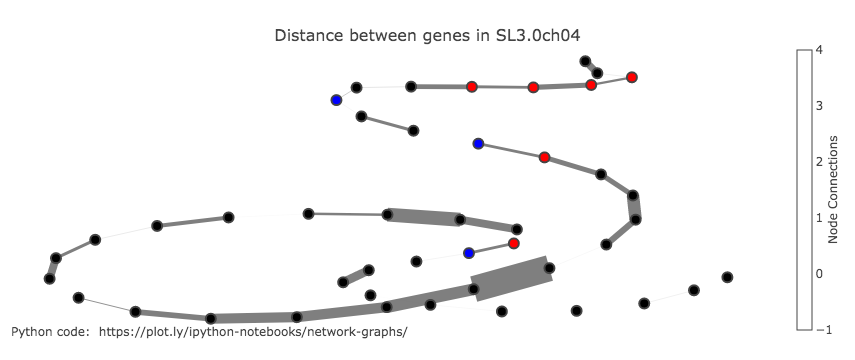

In [23]:
import plotly.plotly as py
import plotly.graph_objs as go
# these two lines allow your code to show up in a notebook
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode()

def calc_distance(data_from_chr):
    tmp_position_data = data_from_chr.iloc[:, 1]
    tmp_position_data = np.stack([np.array(tmp_position_data), np.zeros(tmp_position_data.shape[0])], 1)

    dist = distance.cdist(tmp_position_data, tmp_position_data, metric='euclidean')
    return dist

def draw_graph(position_data):    
    
    dist = calc_distance(position_data)
    descendant = np.zeros(dist.shape)
    for i in range(dist.shape[0] - 1):
        descendant[i][i+1] = dist[i][i+1]
    dist = descendant
    
    dt = [('len', float)]
    A = dist
    A = A.view(dt)

    G = nx.from_numpy_matrix(A)
    pos = nx.spring_layout(G)
#     global fixed_pos
#     fixed_pos = pos

    node_pos = pd.DataFrame(pos)
    
    nodes=dict(type='scatter',
           x=node_pos.iloc[0,:],
           y=node_pos.iloc[1,:],
           mode='markers',
           hoverinfo='text',
           text=position_data["id"]+"\n"+position_data["clade"],
           marker=dict(size=10, color=position_data["color"], colorscale='YlGnBu', showscale=True, reversescale=True, line={'width': 2},
            colorbar=dict(
                thickness=15,
                title='Node Connections',
                xanchor='left',
                titleside='right'
            )))
        
    edges_list=[ dict(type='scatter',
             x=[pos[i[0]][0], pos[i[1]][0]],
             y=[pos[i[0]][1], pos[i[1]][1]],
             mode='lines',
             opacity=0.5,
             line=dict(width=50000/i[2]["len"], color="black"))  for i in G.edges(data=True)]

    fig = Figure(data=edges_list+[nodes],
                 layout=Layout(
                    title='<br>Distance between genes in {}'.format(chr_name),
                    titlefont=dict(size=16),
                    showlegend=False,
                    hovermode='closest',
                    margin=dict(b=20,l=5,r=5,t=40),
                    annotations=[ dict(
                        text="Python code: <a href='https://plot.ly/ipython-notebooks/network-graphs/'> https://plot.ly/ipython-notebooks/network-graphs/</a>",
                        showarrow=False,
                        xref="paper", yref="paper",
                        x=0.005, y=-0.002 ) ],
                    xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                    yaxis=dict(showgrid=False, zeroline=False, showticklabels=False)))

    return fig

# extract clade information
NLR_list = pd.read_csv("original_data/tomato_NLR_clade_AKI.csv")
clade_info = NLR_list.loc[:, ["gene_short_na", "NLR clade"]]

# extract gene_distance info
NLR_gene_info = pd.read_csv("original_data/NLR_gene_info.csv", index_col=0)
position_data = NLR_gene_info.iloc[:, [0,3,4,9]]
position_data.columns = ["chr", "start", "end", "id"]

clade_info.columns = ["id", "clade"]

position_data = pd.merge(position_data, clade_info, on='id', how='left')

#tmp
chr_name = "SL3.0ch04"
position_data = position_data[position_data["chr"] == chr_name]
position_data = position_data.sort_values(["start"])

position_data = position_data.fillna("No_info")

position_data["color"] = "blue"
position_data.loc[position_data["clade"].str.contains("NRC"), "color"] = "red"
position_data.loc[position_data["clade"].str.contains("NRCs-others"), "color"] = "blue"
position_data.loc[position_data["clade"].str.contains("No_info"), "color"] = "black"

print(position_data)

fig = draw_graph(position_data)
# fig = draw_graph(position_data, fixed_position)

plotly.offline.iplot(fig, filename='networkx')
# fig = draw_graph(dist)
# py.iplot(fig, filename='networkx')

          chr     start       end              id        clade        color
46  SL3.0ch04    355238    361526  Solyc04g005540     CNL-RPW8       orange
47  SL3.0ch04    362242    367146  Solyc04g005550     CNL-RPW8       orange
48  SL3.0ch04    742397    747898  Solyc04g007030        NRC4c          red
49  SL3.0ch04    763876    769023  Solyc04g007050         NRC5          red
50  SL3.0ch04    773637    778420  Solyc04g007060        NRC4b          red
51  SL3.0ch04    790864    796155  Solyc04g007070        NRC4a          red
52  SL3.0ch04    801135    804562  Solyc04g007090        CNL13   lightgreen
53  SL3.0ch04   1035127   1040604  Solyc04g007320          TNL       yellow
54  SL3.0ch04   1160127   1166547  Solyc04g007490       CNL-11        black
55  SL3.0ch04   1795220   1800554  Solyc04g008120         CNL9         gray
57  SL3.0ch04   1811258   1827806  Solyc04g008140         CNL9         gray
56  SL3.0ch04   1811261   1814513  Solyc04g008130         CNL9         gray
58  SL3.0ch0

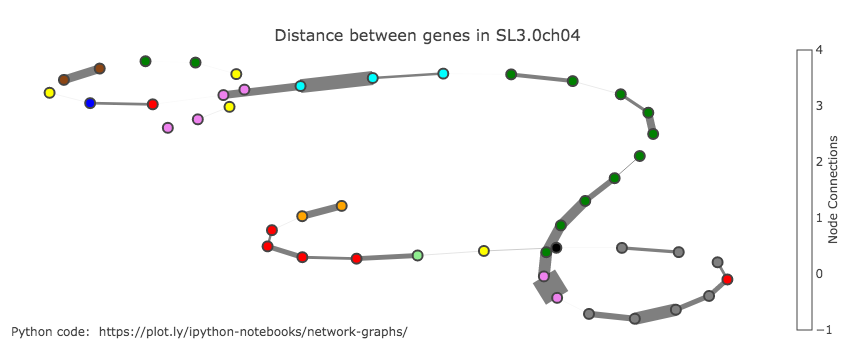

In [25]:
import plotly.plotly as py
import plotly.graph_objs as go
# these two lines allow your code to show up in a notebook
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode()

def calc_distance(data_from_chr):
    tmp_position_data = data_from_chr.iloc[:, 1]
    tmp_position_data = np.stack([np.array(tmp_position_data), np.zeros(tmp_position_data.shape[0])], 1)

    dist = distance.cdist(tmp_position_data, tmp_position_data, metric='euclidean')
    return dist

def draw_graph(position_data):    
    
    dist = calc_distance(position_data)
    descendant = np.zeros(dist.shape)
    for i in range(dist.shape[0] - 1):
        descendant[i][i+1] = dist[i][i+1]
    dist = descendant
    
    dt = [('len', float)]
    A = dist
    A = A.view(dt)

    G = nx.from_numpy_matrix(A)
    pos = nx.spring_layout(G)
    pos = nx.fruchterman_reingold_layout(G)

    node_pos = pd.DataFrame(pos)
    
    nodes=dict(type='scatter',
           x=node_pos.iloc[0,:],
           y=node_pos.iloc[1,:],
           mode='markers',
           hoverinfo='text',
           text=position_data["id"]+"\n"+position_data["clade"],
           marker=dict(size=10, color=position_data["color"], colorscale='YlGnBu', showscale=True, reversescale=True, line={'width': 2},
            colorbar=dict(
                thickness=15,
                title='Node Connections',
                xanchor='left',
                titleside='right'
            )))
        
    edges_list=[ dict(type='scatter',
             x=[pos[i[0]][0], pos[i[1]][0]],
             y=[pos[i[0]][1], pos[i[1]][1]],
             mode='lines',
             opacity=0.5,
             line=dict(width=50000/i[2]["len"], color="black"))  for i in G.edges(data=True)]

    fig = Figure(data=edges_list+[nodes],
                 layout=Layout(
                    title='<br>Distance between genes in {}'.format(chr_name),
                    titlefont=dict(size=16),
                    showlegend=False,
                    hovermode='closest',
                    margin=dict(b=20,l=5,r=5,t=40),
                    annotations=[ dict(
                        text="Python code: <a href='https://plot.ly/ipython-notebooks/network-graphs/'> https://plot.ly/ipython-notebooks/network-graphs/</a>",
                        showarrow=False,
                        xref="paper", yref="paper",
                        x=0.005, y=-0.002 ) ],
                    xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                    yaxis=dict(showgrid=False, zeroline=False, showticklabels=False)))

    return fig

# extract clade information
NLR_list = pd.read_csv("original_data/tomato_NLRs_from_AKI.csv")
clade_info = NLR_list.loc[:, ["gene_short_na", "NLR clade"]]

# extract gene_distance info
NLR_gene_info = pd.read_csv("original_data/NLR_gene_info.csv", index_col=0)
position_data = NLR_gene_info.iloc[:, [0,3,4,9]]
position_data.columns = ["chr", "start", "end", "id"]

clade_info.columns = ["id", "clade"]

position_data = pd.merge(position_data, clade_info, on='id', how='left')

#tmp
chr_name = "SL3.0ch04"
position_data = position_data[position_data["chr"] == chr_name]
position_data = position_data.sort_values(["start"])

position_data = position_data.fillna("No_info")

len(position_data["clade"].unique())
position_data["color"] = "blue"
position_data.loc[position_data["clade"].str.contains("NRC"), "color"] = "red"
position_data.loc[position_data["clade"].str.contains("NRCs-others"), "color"] = "blue"
position_data.loc[position_data["clade"].str.contains("No_info"), "color"] = "black"

colorlist = ["orange", "lightgreen", "yellow", "black", "gray", "violet", "green",
             "cyan", "saddlebrown", "magenta", "navy", "darkcyan", "purple", "olive"]

nrc_calc = 0
for i, clade in enumerate(position_data["clade"].unique()):
    position_data.loc[position_data["clade"] == clade, "color"] = colorlist[i - nrc_calc]
    if 'NRC' in clade:
        position_data.loc[position_data["clade"] == clade, "color"] = "red"
        nrc_calc += 1
    if 'NRCs-others' in clade:
        position_data.loc[position_data["clade"] == clade, "color"] = "blue"

print(position_data)

fig = draw_graph(position_data)
plotly.offline.iplot(fig, filename='networkx')
# # fig = draw_graph(dist)
# # py.iplot(fig, filename='networkx')

          chr     start       end              id        clade  color
46  SL3.0ch04    355238    361526  Solyc04g005540      No_info  black
47  SL3.0ch04    362242    367146  Solyc04g005550      No_info  black
48  SL3.0ch04    742397    747898  Solyc04g007030        NRC4c    red
49  SL3.0ch04    763876    769023  Solyc04g007050         NRC5    red
50  SL3.0ch04    773637    778420  Solyc04g007060        NRC4b    red
51  SL3.0ch04    790864    796155  Solyc04g007070        NRC4a    red
52  SL3.0ch04    801135    804562  Solyc04g007090      No_info  black
53  SL3.0ch04   1035127   1040604  Solyc04g007320      No_info  black
54  SL3.0ch04   1160127   1166547  Solyc04g007490       CNL-11   blue
55  SL3.0ch04   1795220   1800554  Solyc04g008120      No_info  black
57  SL3.0ch04   1811258   1827806  Solyc04g008140      No_info  black
56  SL3.0ch04   1811261   1814513  Solyc04g008130         CNL9   blue
58  SL3.0ch04   1829341   1834179  Solyc04g008150         NRC6    red
59  SL3.0ch04   1839

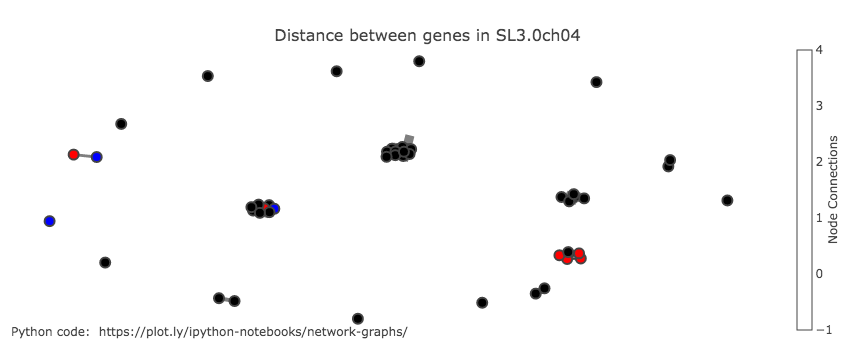

In [26]:
import plotly.plotly as py
import plotly.graph_objs as go
# these two lines allow your code to show up in a notebook
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode()

def calc_distance(data_from_chr):
    tmp_position_data = data_from_chr.iloc[:, 1]
    tmp_position_data = np.stack([np.array(tmp_position_data), np.zeros(tmp_position_data.shape[0])], 1)

    dist = distance.cdist(tmp_position_data, tmp_position_data, metric='euclidean')
    return dist

def draw_graph(position_data):
    
    dist = calc_distance(position_data)
    dist = calc_distance(position_data)
    dist[dist > 100000] = 0
    
    dt = [('len', float)]
    A = dist
    A = A.view(dt)

    G = nx.from_numpy_matrix(A)
    pos = nx.spring_layout(G)
#     global fixed_pos
#     fixed_pos = pos

    node_pos = pd.DataFrame(pos)
    
    nodes=dict(type='scatter',
           x=node_pos.iloc[0,:],
           y=node_pos.iloc[1,:],
           mode='markers',
           hoverinfo='text',
           text=position_data["id"]+"\n"+position_data["clade"],
           marker=dict(size=10, color=position_data["color"], colorscale='YlGnBu', showscale=True, reversescale=True, line={'width': 2},
            colorbar=dict(
                thickness=15,
                title='Node Connections',
                xanchor='left',
                titleside='right'
            )))
        
    edges_list=[ dict(type='scatter',
             x=[pos[i[0]][0], pos[i[1]][0]],
             y=[pos[i[0]][1], pos[i[1]][1]],
             mode='lines',
             opacity=0.5,
             line=dict(width=50000/i[2]["len"], color="black"))  for i in G.edges(data=True)]

    fig = Figure(data=edges_list+[nodes],
                 layout=Layout(
                    title='<br>Distance between genes in {}'.format(chr_name),
                    titlefont=dict(size=16),
                    showlegend=False,
                    hovermode='closest',
                    margin=dict(b=20,l=5,r=5,t=40),
                    annotations=[ dict(
                        text="Python code: <a href='https://plot.ly/ipython-notebooks/network-graphs/'> https://plot.ly/ipython-notebooks/network-graphs/</a>",
                        showarrow=False,
                        xref="paper", yref="paper",
                        x=0.005, y=-0.002 ) ],
                    xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                    yaxis=dict(showgrid=False, zeroline=False, showticklabels=False)))

    return fig

# extract clade information
NLR_list = pd.read_csv("original_data/tomato_NLR_clade_AKI.csv")
clade_info = NLR_list.loc[:, ["gene_short_na", "NLR clade"]]

# extract gene_distance info
NLR_gene_info = pd.read_csv("original_data/NLR_gene_info.csv", index_col=0)
position_data = NLR_gene_info.iloc[:, [0,3,4,9]]
position_data.columns = ["chr", "start", "end", "id"]

clade_info.columns = ["id", "clade"]

position_data = pd.merge(position_data, clade_info, on='id', how='left')

#tmp
chr_name = "SL3.0ch04"
position_data = position_data[position_data["chr"] == chr_name]
position_data = position_data.sort_values(["start"])

position_data = position_data.fillna("No_info")

position_data["color"] = "blue"
position_data.loc[position_data["clade"].str.contains("NRC"), "color"] = "red"
position_data.loc[position_data["clade"].str.contains("NRCs-others"), "color"] = "blue"
position_data.loc[position_data["clade"].str.contains("No_info"), "color"] = "black"

print(position_data)

fig = draw_graph(position_data)
# fig = draw_graph(position_data, fixed_position)

plotly.offline.iplot(fig, filename='networkx')
# fig = draw_graph(dist)
# py.iplot(fig, filename='networkx')

          chr     start       end              id        clade        color
46  SL3.0ch04    355238    361526  Solyc04g005540     CNL-RPW8       orange
47  SL3.0ch04    362242    367146  Solyc04g005550     CNL-RPW8       orange
48  SL3.0ch04    742397    747898  Solyc04g007030        NRC4c          red
49  SL3.0ch04    763876    769023  Solyc04g007050         NRC5          red
50  SL3.0ch04    773637    778420  Solyc04g007060        NRC4b          red
51  SL3.0ch04    790864    796155  Solyc04g007070        NRC4a          red
52  SL3.0ch04    801135    804562  Solyc04g007090        CNL13   lightgreen
53  SL3.0ch04   1035127   1040604  Solyc04g007320          TNL       yellow
54  SL3.0ch04   1160127   1166547  Solyc04g007490       CNL-11        black
55  SL3.0ch04   1795220   1800554  Solyc04g008120         CNL9         gray
57  SL3.0ch04   1811258   1827806  Solyc04g008140         CNL9         gray
56  SL3.0ch04   1811261   1814513  Solyc04g008130         CNL9         gray
58  SL3.0ch0

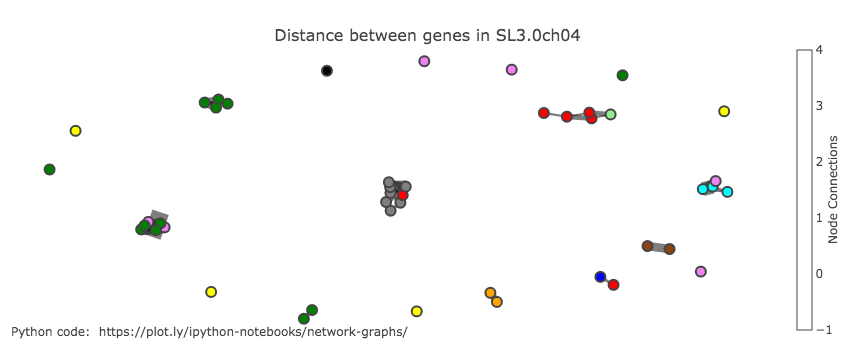

In [28]:
import plotly.plotly as py
import plotly.graph_objs as go
# these two lines allow your code to show up in a notebook
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode()

def calc_distance(data_from_chr):
    tmp_position_data = data_from_chr.iloc[:, 1]
    tmp_position_data = np.stack([np.array(tmp_position_data), np.zeros(tmp_position_data.shape[0])], 1)

    dist = distance.cdist(tmp_position_data, tmp_position_data, metric='euclidean')
    return dist

def draw_graph(position_data, threshold):    
    
    dist = calc_distance(position_data)
    dist = calc_distance(position_data)
    dist[dist > threshold] = 0
    
    dt = [('len', float)]
    A = dist
    A = A.view(dt)

    G = nx.from_numpy_matrix(A)
    pos = nx.spring_layout(G)
    pos = nx.fruchterman_reingold_layout(G)

    node_pos = pd.DataFrame(pos)
    
    nodes=dict(type='scatter',
           x=node_pos.iloc[0,:],
           y=node_pos.iloc[1,:],
           mode='markers',
           hoverinfo='text',
           text=position_data["id"]+"\n"+position_data["clade"],
           marker=dict(size=10, color=position_data["color"], colorscale='YlGnBu', showscale=True, reversescale=True, line={'width': 2},
            colorbar=dict(
                thickness=15,
                title='Node Connections',
                xanchor='left',
                titleside='right'
            )))
        
    edges_list=[ dict(type='scatter',
             x=[pos[i[0]][0], pos[i[1]][0]],
             y=[pos[i[0]][1], pos[i[1]][1]],
             mode='lines',
             opacity=0.5,
             line=dict(width=50000/i[2]["len"], color="black"))  for i in G.edges(data=True)]

    fig = Figure(data=edges_list+[nodes],
                 layout=Layout(
                    title='<br>Distance between genes in {}'.format(chr_name),
                    titlefont=dict(size=16),
                    showlegend=False,
                    hovermode='closest',
                    margin=dict(b=20,l=5,r=5,t=40),
                    annotations=[ dict(
                        text="Python code: <a href='https://plot.ly/ipython-notebooks/network-graphs/'> https://plot.ly/ipython-notebooks/network-graphs/</a>",
                        showarrow=False,
                        xref="paper", yref="paper",
                        x=0.005, y=-0.002 ) ],
                    xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                    yaxis=dict(showgrid=False, zeroline=False, showticklabels=False)))

    return fig

# extract clade information
NLR_list = pd.read_csv("original_data/tomato_NLRs_from_AKI.csv")
clade_info = NLR_list.loc[:, ["gene_short_na", "NLR clade"]]

# extract gene_distance info
NLR_gene_info = pd.read_csv("original_data/NLR_gene_info.csv", index_col=0)
position_data = NLR_gene_info.iloc[:, [0,3,4,9]]
position_data.columns = ["chr", "start", "end", "id"]

clade_info.columns = ["id", "clade"]

position_data = pd.merge(position_data, clade_info, on='id', how='left')

#tmp
chr_name = "SL3.0ch04"
position_data = position_data[position_data["chr"] == chr_name]
position_data = position_data.sort_values(["start"])

position_data = position_data.fillna("No_info")

len(position_data["clade"].unique())
position_data["color"] = "blue"
position_data.loc[position_data["clade"].str.contains("NRC"), "color"] = "red"
position_data.loc[position_data["clade"].str.contains("NRCs-others"), "color"] = "blue"
position_data.loc[position_data["clade"].str.contains("No_info"), "color"] = "black"

colorlist = ["orange", "lightgreen", "yellow", "black", "gray", "violet", "green",
             "cyan", "saddlebrown", "magenta", "navy", "darkcyan", "purple", "olive"]

nrc_calc = 0
for i, clade in enumerate(position_data["clade"].unique()):
    position_data.loc[position_data["clade"] == clade, "color"] = colorlist[i - nrc_calc]
    if 'NRC' in clade:
        position_data.loc[position_data["clade"] == clade, "color"] = "red"
        nrc_calc += 1
    if 'NRCs-others' in clade:
        position_data.loc[position_data["clade"] == clade, "color"] = "blue"

print(position_data)

fig = draw_graph(position_data, threshold=30000)
plotly.offline.iplot(fig, filename='networkx')
# # fig = draw_graph(dist)
# # py.iplot(fig, filename='networkx')

          chr     start       end              id        clade  Leaf  Root
46  SL3.0ch04    355238    361526  Solyc04g005540     CNL-RPW8   1.0   1.0
47  SL3.0ch04    362242    367146  Solyc04g005550     CNL-RPW8   1.0   1.0
48  SL3.0ch04    742397    747898  Solyc04g007030        NRC4c   1.0   1.0
49  SL3.0ch04    763876    769023  Solyc04g007050         NRC5   0.1   1.0
50  SL3.0ch04    773637    778420  Solyc04g007060        NRC4b   1.0   1.0
51  SL3.0ch04    790864    796155  Solyc04g007070        NRC4a   1.0   1.0
52  SL3.0ch04    801135    804562  Solyc04g007090        CNL13   0.1   1.0
53  SL3.0ch04   1035127   1040604  Solyc04g007320          TNL   1.0   1.0
54  SL3.0ch04   1160127   1166547  Solyc04g007490       CNL-11   1.0   1.0
55  SL3.0ch04   1795220   1800554  Solyc04g008120         CNL9   0.1   1.0
57  SL3.0ch04   1811258   1827806  Solyc04g008140         CNL9   0.1   1.0
56  SL3.0ch04   1811261   1814513  Solyc04g008130         CNL9   0.1   1.0
58  SL3.0ch04   1829341  

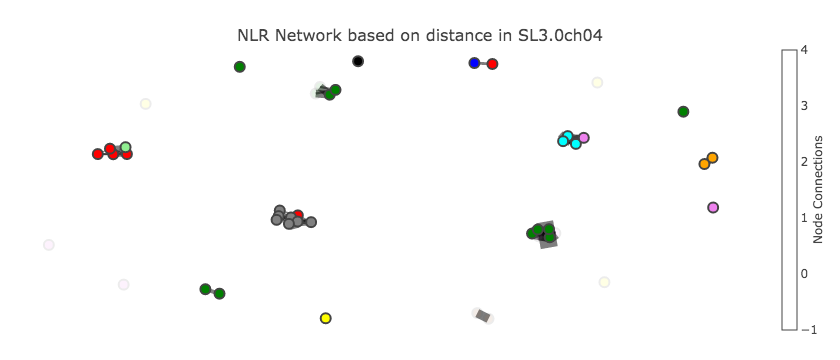

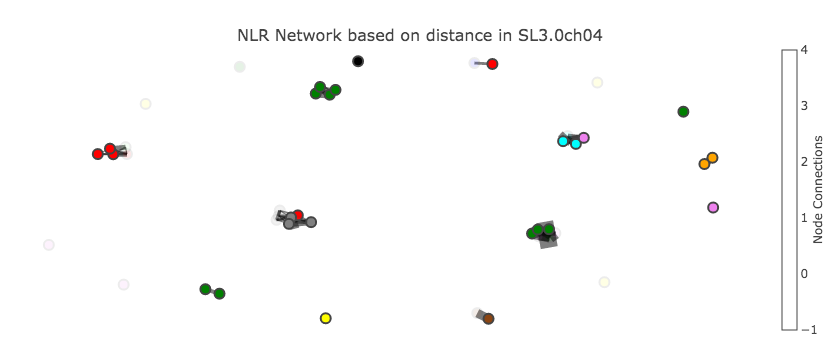

In [22]:
import pandas as pd
import numpy as np
from scipy.spatial import distance
import networkx as nx
import string
import plotly
import plotly.plotly as py
from plotly.graph_objs import *
# these two lines allow your code to show up in a notebook
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode()

def calc_distance(data_from_chr):
    tmp_position_data = data_from_chr.iloc[:, 1]
    tmp_position_data = np.stack([np.array(tmp_position_data), np.zeros(tmp_position_data.shape[0])], 1)

    dist = distance.cdist(tmp_position_data, tmp_position_data, metric='euclidean')
    return dist

def draw_graph(position_data, threshold, part, fixed_pos):    
    
    dist = calc_distance(position_data)
    dist[dist > threshold] = 0
    
    dt = [('len', float)]
    A = dist
    A = A.view(dt)

    G = nx.from_numpy_matrix(A)
    if fixed_pos != "NaN":
        fixed_nodes = fixed_pos.keys()
        pos = nx.spring_layout(G, pos=fixed_pos, fixed=fixed_nodes)
    else:
        pos = nx.spring_layout(G)
    
    node_pos = pd.DataFrame(pos)
    
    if part == "Root":
        nodes_opacity = position_data["Root"]
    else:
        nodes_opacity = position_data["Leaf"]
    
    nodes=dict(type='scatter',
           x=node_pos.iloc[0,:],
           y=node_pos.iloc[1,:],
           mode='markers',
           hoverinfo='text',
           text=position_data["id"]+"\n"+position_data["clade"],
           marker=dict(size=10, opacity=nodes_opacity, color=position_data["color"], colorscale='YlGnBu', showscale=True, reversescale=True, line={'width': 2},
            colorbar=dict(
                thickness=15,
                title='Node Connections',
                xanchor='left',
                titleside='right'
            )))
        
    edges_list=[ dict(type='scatter',
             x=[pos[i[0]][0], pos[i[1]][0]],
             y=[pos[i[0]][1], pos[i[1]][1]],
             mode='lines',
             opacity=0.5,
             line=dict(width=50000/i[2]["len"], color="black"))  for i in G.edges(data=True)]

    fig = Figure(data=edges_list+[nodes],
                 layout=Layout(
                    title='<br>NLR Network based on distance in {}'.format(chr_name),
                    titlefont=dict(size=16),
                    showlegend=False,
                    hovermode='closest',
                    margin=dict(b=20,l=5,r=5,t=40),
                    xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                    yaxis=dict(showgrid=False, zeroline=False, showticklabels=False)))

    return fig, pos

# extract clade information
NLR_list = pd.read_csv("original_data/tomato_NLRs_from_AKI.csv")
clade_info = NLR_list.loc[:, ["gene_short_na", "NLR clade"]]

# extract gene_distance info
NLR_gene_info = pd.read_csv("original_data/NLR_gene_info.csv", index_col=0)
position_data = NLR_gene_info.iloc[:, [0,3,4,9]]
position_data.columns = ["chr", "start", "end", "id"]

clade_info.columns = ["id", "clade"]

position_data = pd.merge(position_data, clade_info, on='id', how='left')

leaf_NLR = pd.read_csv("original_data/leaf_NLR.csv")
leaf_NLR = leaf_NLR.loc[:, "gene_short_na"]

root_NLR = pd.read_csv("original_data/root_NLR.csv")
root_NLR = root_NLR.loc[:, "gene_short_na"]

np.ones(position_data.shape[0])
position_data["Leaf"] = np.ones(position_data.shape[0])
position_data.loc[~position_data.loc[:, "id"].isin(leaf_NLR), "Leaf"] = 0.1
position_data["Root"] = np.ones(position_data.shape[0])
position_data.loc[~position_data.loc[:, "id"].isin(root_NLR), "Root"] = 0.1

#tmp
chr_name = "SL3.0ch04"
position_data = position_data[position_data["chr"] == chr_name]
position_data = position_data.sort_values(["start"])

position_data = position_data.fillna("No_info")

print(position_data)

position_data["color"] = "blue"
position_data.loc[position_data["clade"].str.contains("NRC"), "color"] = "red"
position_data.loc[position_data["clade"].str.contains("NRCs-others"), "color"] = "blue"
position_data.loc[position_data["clade"].str.contains("No_info"), "color"] = "black"

colorlist = ["orange", "lightgreen", "yellow", "black", "gray", "violet", "green",
             "cyan", "saddlebrown", "magenta", "navy", "darkcyan", "purple", "olive"]

nrc_calc = 0
for i, clade in enumerate(position_data["clade"].unique()):
    position_data.loc[position_data["clade"] == clade, "color"] = colorlist[i - nrc_calc]
    if 'NRC' in clade:
        position_data.loc[position_data["clade"] == clade, "color"] = "red"
        nrc_calc += 1
    if 'NRCs-others' in clade:
        position_data.loc[position_data["clade"] == clade, "color"] = "blue"

fig, pos = draw_graph(position_data, threshold=50000, part="Root", fixed_pos="NaN")
plotly.offline.iplot(fig, filename='networkx')
print("\n")
fig, pos = draw_graph(position_data, threshold=50000, part="Leaf", fixed_pos=pos)
plotly.offline.iplot(fig, filename='networkx')